In [1]:
#Impor Library SK - Fuzzy
import numpy as np
import matplotlib.pyplot as plt
import warnings
import pandas as pd

warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('faktor_data_CR_kualitasair.csv', sep=';')
df

,ammonia,arsenic,is_safe
0,9.08,0.04,1
1,21.16,0.01,1
2,14.02,0.04,0
3,11.33,0.04,1
4,24.33,0.03,1
...,...,...,...
395,7.78,0.00,1
396,24.22,0.02,1
397,6.85,0.00,1
398,10.00,0.01,1


In [3]:
df.describe()

,ammonia,arsenic,is_safe
count,400.000000,400.000000,400.000000
mean,15.386400,0.364150,0.237500
std,8.669933,0.332204,0.426084
min,0.030000,0.000000,0.000000
25%,8.617500,0.047500,0.000000
50%,15.255000,0.280000,0.000000
75%,23.160000,0.660000,0.000000
max,29.720000,1.040000,1.000000


Fuzzifikasi

In [4]:
def fungsi_segitiga(x, amb):
    """
    Fungsi Keanggotaan Segitiga.
    Parameter:
    ----------
    x   : Array 1 dimensi, semesta himpunan x  
    amb : Array 1 dimensi, terdiri dari 3 elemen a, m, b, yang mana a<=m<=b
    
    Hasil
    -------
    miu   : Array 1 dimensi fungsi keanggotaan segitiga 
    
    Fungsi keanggotaan segitiga:
    """
    assert len(amb) == 3, 'parameter amb harus tepat tiga elemen'
    a, m, b = np.r_[amb]    # Zero-indexing di Python
    assert a <= m and m <= b, 'paremeter harus memenuhi syarat berikut: a <= m <= b.'

    miu = np.zeros(len(x))

    # Sisi Kiri
    if a != m:
        idx = np.nonzero(np.logical_and(a < x, x < m))[0]
        miu[idx] = (x[idx] - a) / float(m - a)

    # Sisi Kanan
    if m != b:
        idx = np.nonzero(np.logical_and(m < x, x < b))[0]
        miu[idx] = (b - x[idx]) / float(b - m)

    idx = np.nonzero(x == m)
    miu[idx] = 1
    
    return miu

In [5]:
def miu_fungsi_segitiga(array_x, amb, x_i):
    """
    Fungsi Keanggotaan Segitiga.
    Parameter:
    ----------
    x   : Array 1 dimensi, semesta himpunan x  
    amb : Array 1 dimensi, terdiri dari 3 elemen a, m, b, yang mana a<=m<=b
    
    Hasil
    -------
    miu   : Array 1 dimensi fungsi keanggotaan segitiga 
    
    Fungsi keanggotaan segitiga:
    """
    assert len(amb) == 3, 'parameter amb harus tepat tiga elemen'
    a, m, b = np.r_[amb]    # Zero-indexing di Python
    assert a <= m and m <= b, 'paremeter harus memenuhi syarat berikut: a <= m <= b.'

    miu = np.zeros(len(array_x))

    # Sisi Kiri
    if a != m:
        idx = np.nonzero(np.logical_and(a < array_x, array_x < m))[0]
        miu[idx] = (array_x[idx] - a) / float(m - a)

    # Sisi Kanan
    if m != b:
        idx = np.nonzero(np.logical_and(m < array_x, array_x < b))[0]
        miu[idx] = (b - array_x[idx]) / float(b - m)

    idx = np.nonzero(array_x == m)
    miu[idx] = 1

    dict_fuzzy=res = {round(array_x[i],2): miu[i] for i in range(len(array_x))}
    print(dict_fuzzy)
    hasil = dict_fuzzy[x_i]

    return hasil

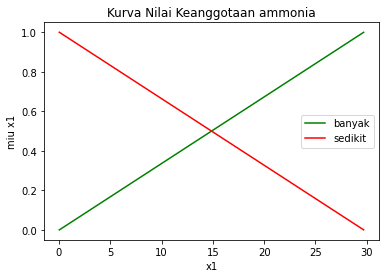

In [6]:
# Pembentukan Himpunan Fuzzy ammonia[fungsi buat sendiri]
x_ammonia	= np.arange(0.03, 29.72, 0.01) # Semesta Pembicaraan
amb_banyak = [0.03, 29.72, 29.72]
amb_sedikit = [0.03, 0.03, 29.72]

miu_ammonia_banyak = fungsi_segitiga(x_ammonia, amb_banyak)
miu_ammonia_sedikit = fungsi_segitiga(x_ammonia, amb_sedikit)

import matplotlib.pyplot as plt
plt.plot(x_ammonia, miu_ammonia_banyak, label = "banyak", color='green')
plt.plot(x_ammonia, miu_ammonia_sedikit, label = "sedikit", color='red')
plt.xlabel('x1')
plt.ylabel('miu x1')
plt.title('Kurva Nilai Keanggotaan ammonia')
plt.legend()
plt.show()

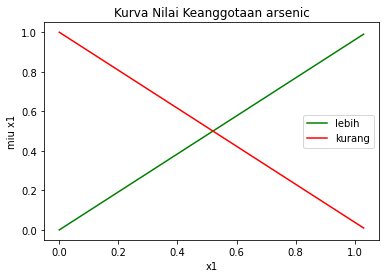

In [7]:
# Pembentukan Himpunan Fuzzy arsenic [fungsi buat sendiri]
x_arsenic	= np.arange(0, 1.04, 0.01) # Semesta Pembicaraan
amb_lebih = [0, 1.04, 1.04]
amb_kurang = [0, 0, 1.04]

miu_arsenic_lebih = fungsi_segitiga(x_arsenic, amb_lebih)
miu_arsenic_kurang = fungsi_segitiga(x_arsenic, amb_kurang)

import matplotlib.pyplot as plt
plt.plot(x_arsenic, miu_arsenic_lebih, label = "lebih", color='green')
plt.plot(x_arsenic, miu_arsenic_kurang, label = "kurang", color='red')
plt.xlabel('x1')
plt.ylabel('miu x1')
plt.title('Kurva Nilai Keanggotaan arsenic')
plt.legend()
plt.show()

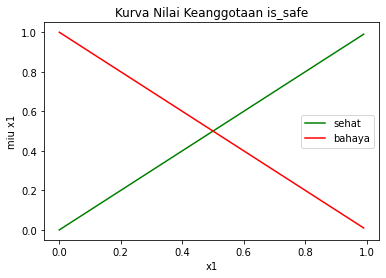

In [12]:
# Pembentukan Himpunan Fuzzy is_safe [fungsi buat sendiri]
x_is_safe	= np.arange(0, 1, 0.01) # Semesta Pembicaraan
amb_sehat = [0, 1, 1]
amb_bahaya = [0, 0, 1]

miu_is_safe_sehat = fungsi_segitiga(x_is_safe, amb_sehat)
miu_is_safe_bahaya = fungsi_segitiga(x_is_safe, amb_bahaya)

import matplotlib.pyplot as plt
plt.plot(x_is_safe, miu_is_safe_sehat, label = "sehat", color='green')
plt.plot(x_is_safe, miu_is_safe_bahaya, label = "bahaya", color='red')
plt.xlabel('x1')
plt.ylabel('miu x1')
plt.title('Kurva Nilai Keanggotaan is_safe')
plt.legend()
plt.show()

In [8]:
def fuzzyfikasi(x_array, amd_1, amd_2, x, label_1, label_2):
    batas = (max(x_array)+min(x_array))/2
    print(batas)
    hasil=0
    if x < batas:
        hasil=miu_fungsi_segitiga(x_array, amd_1, x)
        label_hasil = label_1
    else:
        hasil=miu_fungsi_segitiga(x_array, amd_2, x)
        label_hasil = label_2
    return hasil, label_hasil

In [9]:
x_ammonia	= np.arange(0.03, 29.73, 0.01) # Semesta Pembicaraan
amb_banyak = [0.03, 29.72, 29.72]
amb_sedikit = [0.03, 0.03, 29.72]

fuzzifikasi_ammonia=[]
miu_ammonia=[]
for i in df.ammonia:
    hasil=fuzzyfikasi(x_ammonia, amb_banyak, amb_sedikit, i, "banyak", "sedikit")
    fuzz = hasil[1]
    m = hasil[0]
    fuzzifikasi_ammonia.append(fuzz)
    miu_ammonia.append(m)
    
len(fuzzifikasi_ammonia)

14.875000000000004
{0.03: 0.0, 0.04: 0.00033681374200067373, 0.05: 0.0006736274840013475, 0.06: 0.001010441226002021, 0.07: 0.001347254968002695, 0.08: 0.0016840687100033688, 0.09: 0.002020882452004042, 0.1: 0.0023576961940047158, 0.11: 0.00269450993600539, 0.12: 0.003031323678006064, 0.13: 0.0033681374200067366, 0.14: 0.0037049511620074107, 0.15: 0.004041764904008084, 0.16: 0.004378578646008759, 0.17: 0.0047153923880094315, 0.18: 0.005052206130010105, 0.19: 0.00538901987201078, 0.2: 0.005725833614011453, 0.21: 0.006062647356012128, 0.22: 0.0063994610980128005, 0.23: 0.006736274840013474, 0.24: 0.007073088582014149, 0.25: 0.0074099023240148205, 0.26: 0.007746716066015494, 0.27: 0.008083529808016169, 0.28: 0.008420343550016841, 0.29: 0.008757157292017516, 0.3: 0.009093971034018189, 0.31: 0.009430784776018863, 0.32: 0.009767598518019538, 0.33: 0.01010441226002021, 0.34: 0.010441226002020885, 0.35: 0.01077803974402156, 0.36: 0.011114853486022234, 0.37: 0.011451667228022907, 0.38: 0.011788

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{0.03: 1.0, 0.04: 0.9996631862579994, 0.05: 0.9993263725159987, 0.06: 0.9989895587739981, 0.07: 0.9986527450319973, 0.08: 0.9983159312899967, 0.09: 0.997979117547996, 0.1: 0.9976423038059953, 0.11: 0.9973054900639947, 0.12: 0.9969686763219939, 0.13: 0.9966318625799934, 0.14: 0.9962950488379926, 0.15: 0.995958235095992, 0.16: 0.9956214213539912, 0.17: 0.9952846076119906, 0.18: 0.99494779386999, 0.19: 0.9946109801279892, 0.2: 0.9942741663859886, 0.21: 0.9939373526439879, 0.22: 0.9936005389019873, 0.23: 0.9932637251599865, 0.24: 0.992926911417986, 0.25: 0.9925900976759853, 0.26: 0.9922532839339845, 0.27: 0.9919164701919839, 0.28: 0.9915796564499831, 0.29: 0.9912428427079826, 0.3: 0.9909060289659818, 0.31: 0.9905692152239812, 0.32: 0.9902324014819804, 0.33: 0.9898955877399799, 0.34: 0.9895587739979792, 0.35: 0.9892219602559784, 0.36: 0.9888851465139779, 0.37: 0.9885483327719771, 0.38: 0.9882115190299765, 0.39: 0.9878747052879757, 0.4: 0.9875378915459752, 0.41: 0.9872010778039745, 0.42: 0.9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{0.03: 1.0, 0.04: 0.9996631862579994, 0.05: 0.9993263725159987, 0.06: 0.9989895587739981, 0.07: 0.9986527450319973, 0.08: 0.9983159312899967, 0.09: 0.997979117547996, 0.1: 0.9976423038059953, 0.11: 0.9973054900639947, 0.12: 0.9969686763219939, 0.13: 0.9966318625799934, 0.14: 0.9962950488379926, 0.15: 0.995958235095992, 0.16: 0.9956214213539912, 0.17: 0.9952846076119906, 0.18: 0.99494779386999, 0.19: 0.9946109801279892, 0.2: 0.9942741663859886, 0.21: 0.9939373526439879, 0.22: 0.9936005389019873, 0.23: 0.9932637251599865, 0.24: 0.992926911417986, 0.25: 0.9925900976759853, 0.26: 0.9922532839339845, 0.27: 0.9919164701919839, 0.28: 0.9915796564499831, 0.29: 0.9912428427079826, 0.3: 0.9909060289659818, 0.31: 0.9905692152239812, 0.32: 0.9902324014819804, 0.33: 0.9898955877399799, 0.34: 0.9895587739979792, 0.35: 0.9892219602559784, 0.36: 0.9888851465139779, 0.37: 0.9885483327719771, 0.38: 0.9882115190299765, 0.39: 0.9878747052879757, 0.4: 0.9875378915459752, 0.41: 0.9872010778039745, 0.42: 0.9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{0.03: 0.0, 0.04: 0.00033681374200067373, 0.05: 0.0006736274840013475, 0.06: 0.001010441226002021, 0.07: 0.001347254968002695, 0.08: 0.0016840687100033688, 0.09: 0.002020882452004042, 0.1: 0.0023576961940047158, 0.11: 0.00269450993600539, 0.12: 0.003031323678006064, 0.13: 0.0033681374200067366, 0.14: 0.0037049511620074107, 0.15: 0.004041764904008084, 0.16: 0.004378578646008759, 0.17: 0.0047153923880094315, 0.18: 0.005052206130010105, 0.19: 0.00538901987201078, 0.2: 0.005725833614011453, 0.21: 0.006062647356012128, 0.22: 0.0063994610980128005, 0.23: 0.006736274840013474, 0.24: 0.007073088582014149, 0.25: 0.0074099023240148205, 0.26: 0.007746716066015494, 0.27: 0.008083529808016169, 0.28: 0.008420343550016841, 0.29: 0.008757157292017516, 0.3: 0.009093971034018189, 0.31: 0.009430784776018863, 0.32: 0.009767598518019538, 0.33: 0.01010441226002021, 0.34: 0.010441226002020885, 0.35: 0.01077803974402156, 0.36: 0.011114853486022234, 0.37: 0.011451667228022907, 0.38: 0.011788480970023581, 0.39:

400

In [10]:
x_arsenic	= np.arange(0, 1.05, 0.01) # Semesta Pembicaraan
amb_lebih = [0, 1.04, 1.04]
amb_kurang = [0, 0, 1.04]

fuzzifikasi_arsenic=[]
miu_arsenic=[]
for i in df.arsenic:
    hasil=fuzzyfikasi(x_arsenic, amb_lebih, amb_kurang, i, "lebih", "kurang")
    fuzz = hasil[1]
    m =hasil[0]
    fuzzifikasi_arsenic.append(fuzz)
    miu_arsenic.append(m)
len(fuzzifikasi_arsenic)

0.52
{0.0: 0.0, 0.01: 0.009615384615384616, 0.02: 0.019230769230769232, 0.03: 0.028846153846153844, 0.04: 0.038461538461538464, 0.05: 0.04807692307692308, 0.06: 0.05769230769230769, 0.07: 0.06730769230769232, 0.08: 0.07692307692307693, 0.09: 0.08653846153846154, 0.1: 0.09615384615384616, 0.11: 0.10576923076923077, 0.12: 0.11538461538461538, 0.13: 0.125, 0.14: 0.13461538461538464, 0.15: 0.14423076923076922, 0.16: 0.15384615384615385, 0.17: 0.16346153846153846, 0.18: 0.17307692307692307, 0.19: 0.18269230769230768, 0.2: 0.19230769230769232, 0.21: 0.2019230769230769, 0.22: 0.21153846153846154, 0.23: 0.22115384615384615, 0.24: 0.23076923076923075, 0.25: 0.24038461538461536, 0.26: 0.25, 0.27: 0.25961538461538464, 0.28: 0.2692307692307693, 0.29: 0.2788461538461538, 0.3: 0.28846153846153844, 0.31: 0.2980769230769231, 0.32: 0.3076923076923077, 0.33: 0.3173076923076923, 0.34: 0.3269230769230769, 0.35: 0.33653846153846156, 0.36: 0.34615384615384615, 0.37: 0.3557692307692307, 0.38: 0.3653846153846

400

In [14]:
# Pembentukan Himpunan Fuzzy is_safe [fungsi buat sendiri]
x_is_safe	= np.arange(0, 2, 0.01) # Semesta Pembicaraan
amb_sehat = [0, 1, 1]
amb_bahaya = [0, 0, 1]

fuzzifikasi_is_safe=[]
miu_is_safe=[]
for i in df.is_safe:
    hasil=fuzzyfikasi(x_is_safe, amb_sehat, amb_bahaya, i, "sehat", "bahaya")
    fuzz = hasil[1]
    m =hasil[0]
    fuzzifikasi_is_safe.append(fuzz)
    miu_is_safe.append(m)
len(fuzzifikasi_is_safe)

0.995
{0.0: 1.0, 0.01: 0.99, 0.02: 0.98, 0.03: 0.97, 0.04: 0.96, 0.05: 0.95, 0.06: 0.94, 0.07: 0.9299999999999999, 0.08: 0.92, 0.09: 0.91, 0.1: 0.9, 0.11: 0.89, 0.12: 0.88, 0.13: 0.87, 0.14: 0.86, 0.15: 0.85, 0.16: 0.84, 0.17: 0.83, 0.18: 0.8200000000000001, 0.19: 0.81, 0.2: 0.8, 0.21: 0.79, 0.22: 0.78, 0.23: 0.77, 0.24: 0.76, 0.25: 0.75, 0.26: 0.74, 0.27: 0.73, 0.28: 0.72, 0.29: 0.71, 0.3: 0.7, 0.31: 0.69, 0.32: 0.6799999999999999, 0.33: 0.6699999999999999, 0.34: 0.6599999999999999, 0.35: 0.6499999999999999, 0.36: 0.64, 0.37: 0.63, 0.38: 0.62, 0.39: 0.61, 0.4: 0.6, 0.41: 0.59, 0.42: 0.5800000000000001, 0.43: 0.5700000000000001, 0.44: 0.56, 0.45: 0.55, 0.46: 0.54, 0.47: 0.53, 0.48: 0.52, 0.49: 0.51, 0.5: 0.5, 0.51: 0.49, 0.52: 0.48, 0.53: 0.47, 0.54: 0.45999999999999996, 0.55: 0.44999999999999996, 0.56: 0.43999999999999995, 0.57: 0.42999999999999994, 0.58: 0.42000000000000004, 0.59: 0.41000000000000003, 0.6: 0.4, 0.61: 0.39, 0.62: 0.38, 0.63: 0.37, 0.64: 0.36, 0.65: 0.35, 0.66: 0.33999

400

In [15]:
df_fuzz = pd.DataFrame({"ammonia":df.ammonia,
                        "arsenic":df.arsenic,
                        "is_safe":df.is_safe,
                        "ammonia_fuzz": fuzzifikasi_ammonia,
                       "arsenic_fuzz": fuzzifikasi_arsenic,
                       "is_safe_fuzz": fuzzifikasi_is_safe,
                       "miu_ammonia":miu_ammonia,
                       "miu_arsenic":miu_arsenic,
                       "miu_is_safe":miu_is_safe,})
df_fuzz

,ammonia,arsenic,is_safe,ammonia_fuzz,arsenic_fuzz,is_safe_fuzz,miu_ammonia,miu_arsenic,miu_is_safe
0,9.08,0.04,1,banyak,lebih,bahaya,0.304816,0.038462,0.0
1,21.16,0.01,1,sedikit,lebih,bahaya,0.288313,0.009615,0.0
2,14.02,0.04,0,banyak,lebih,sehat,0.471202,0.038462,0.0
3,11.33,0.04,1,banyak,lebih,bahaya,0.380600,0.038462,0.0
4,24.33,0.03,1,sedikit,lebih,bahaya,0.181543,0.028846,0.0
...,...,...,...,...,...,...,...,...,...
395,7.78,0.00,1,banyak,lebih,bahaya,0.261031,0.000000,0.0
396,24.22,0.02,1,sedikit,lebih,bahaya,0.185248,0.019231,0.0
397,6.85,0.00,1,banyak,lebih,bahaya,0.229707,0.000000,0.0
398,10.00,0.01,1,banyak,lebih,bahaya,0.335803,0.009615,0.0


In [16]:
df_fuzz['Rule'] = "Jika X1 " + df_fuzz['ammonia_fuzz'] + " X2 " + df_fuzz['arsenic_fuzz'] + " maka Y " + df_fuzz['is_safe_fuzz']
df_fuzz.head()

,ammonia,arsenic,is_safe,ammonia_fuzz,arsenic_fuzz,is_safe_fuzz,miu_ammonia,miu_arsenic,miu_is_safe,Rule
0,9.08,0.04,1,banyak,lebih,bahaya,0.304816,0.038462,0.0,Jika X1 banyak X2 lebih maka Y bahaya
1,21.16,0.01,1,sedikit,lebih,bahaya,0.288313,0.009615,0.0,Jika X1 sedikit X2 lebih maka Y bahaya
2,14.02,0.04,0,banyak,lebih,sehat,0.471202,0.038462,0.0,Jika X1 banyak X2 lebih maka Y sehat
3,11.33,0.04,1,banyak,lebih,bahaya,0.380600,0.038462,0.0,Jika X1 banyak X2 lebih maka Y bahaya
4,24.33,0.03,1,sedikit,lebih,bahaya,0.181543,0.028846,0.0,Jika X1 sedikit X2 lebih maka Y bahaya


In [17]:
df_fuzz['Rule'].value_counts()

Jika X1 sedikit X2 lebih maka Y sehat      101
Jika X1 banyak X2 lebih maka Y sehat        74
Jika X1 banyak X2 kurang maka Y sehat       68
Jika X1 sedikit X2 kurang maka Y sehat      62
Jika X1 banyak X2 lebih maka Y bahaya       49
Jika X1 sedikit X2 lebih maka Y bahaya      38
Jika X1 banyak X2 kurang maka Y bahaya       5
Jika X1 sedikit X2 kurang maka Y bahaya      3
Name: Rule, dtype: int64

In [23]:
# Rule 1
rule_1 = df_fuzz[df_fuzz['Rule']=="Jika X1 sedikit X2 lebih maka Y sehat"]
index=rule_1.index
data_rule_1=df_fuzz.iloc[index,:3]
data_rule_1.to_csv('Rule1.csv') 
data_rule_1.head()

,ammonia,arsenic,is_safe
7,19.87,0.04,0
20,15.75,0.03,0
21,29.29,0.01,0
26,19.90,0.03,0
28,22.32,0.01,0


In [24]:
# Rule 2
rule_2 = df_fuzz[df_fuzz['Rule']=="Jika X1 banyak X2 lebih maka Y sehat"]
index=rule_2.index
data_rule_2=df_fuzz.iloc[index,:3]
data_rule_2.to_csv('Rule2.csv') 
data_rule_2.head()

,ammonia,arsenic,is_safe
2,14.02,0.04,0
6,5.60,0.01,0
10,3.60,0.01,0
25,13.08,0.04,0
27,9.49,0.05,0


In [20]:
# Rule 3
rule_2 = df_fuzz[df_fuzz['Rule']=="Jika X1 banyak X2 kurang maka Y sehat"]
index=rule_2.index
data_rule_2=df_fuzz.iloc[index,:3]
data_rule_2.to_csv('Rule2.csv') 
data_rule_2.head()